In [1]:
import numpy as np
import matplotlib.pyplot as plt

from stats import compute_percentage_of_agreements_and_ranks, compute_confusion_matrix_of_ranks
from communication.message.MessageService import MessageService

In [2]:
MessageService.reset()
agreed_on, commited_item_rank = compute_percentage_of_agreements_and_ranks(5000)


Experiment 0 :
Criterion order : DURABILITY > ENVIRONMENT_IMPACT > CONSUMPTION > PRODUCTION_COST > NOISE
Criterion values :
 |PRODUCTION_COST|CONSUMPTION|DURABILITY|ENVIRONMENT_IMPACT|NOISE
B|**             |****       |***       |***               |**    | 568.75
C|*              |*          |***       |**                |****  | 375.0
A|***            |*          |***       |*                 |***   | 356.25
D|***            |*          |***       |*                 |****  | 362.5

Criterion order : CONSUMPTION > NOISE > DURABILITY > ENVIRONMENT_IMPACT > PRODUCTION_COST
Criterion values :
 |PRODUCTION_COST|CONSUMPTION|DURABILITY|ENVIRONMENT_IMPACT|NOISE
B|**             |****       |****      |***               |*     | 543.75
C|*              |*          |***       |**                |****  | 287.5
A|****           |*          |****      |*                 |**    | 175.0
D|**             |*          |****      |**                |****  | 318.75

From 1 to 2 (PROPOSE) B
From 2 to 1 

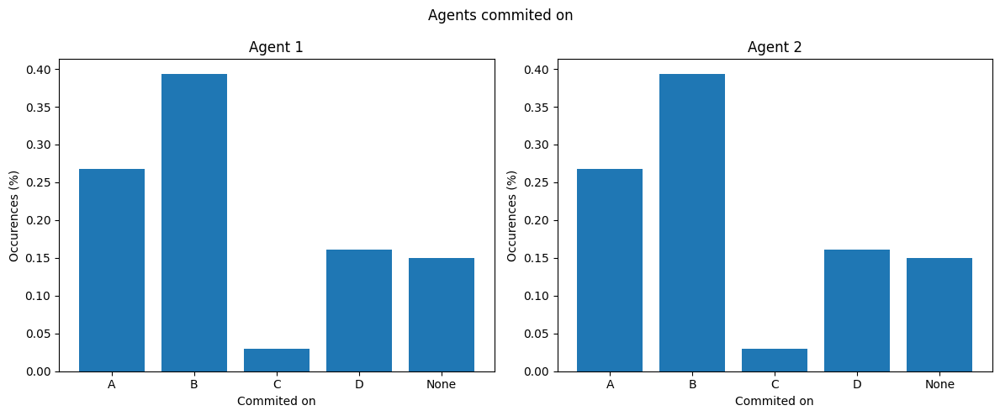

In [3]:
fig, axes = plt.subplots(ncols=len(agreed_on), figsize=(12, 5), tight_layout=True)

titles = ["Agent 1", "Agent 2"]
fig.suptitle("Agents commited on")

for i in range(len(agreed_on)):
    labels, values = zip(*agreed_on[i].items())
    labels_values = list(zip(labels, values))
    labels_values.sort(key=lambda x : x[0])
    labels = [item[0] for item in labels_values]
    values = [item[1]/sum(values) for item in labels_values]

    indexes = np.arange(len(labels))
    width = 0.8

    axes[i].bar(indexes, values, width)
    axes[i].set_xticks(indexes, labels)
    axes[i].set_title(titles[i])
    axes[i].set_xlabel("Commited on")
    axes[i].set_ylabel("Occurences (%)")
plt.show()

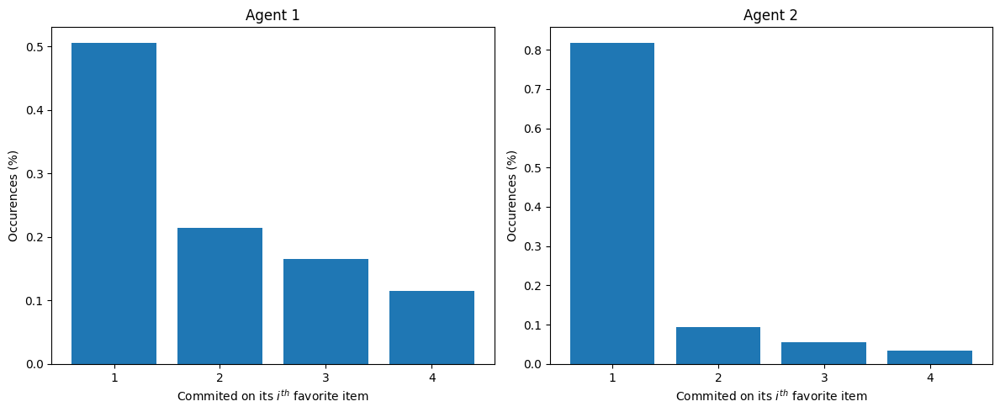

In [4]:
fig, axes = plt.subplots(ncols=len(commited_item_rank), figsize=(12, 5), tight_layout=True)

titles = ["Agent 1", "Agent 2"]

for i in range(len(commited_item_rank)):
    labels, values = zip(*commited_item_rank[i].items())
    labels_values = list(zip(labels, values))
    labels_values.sort(key=lambda x : x[0])
    labels = [item[0] for item in labels_values]
    values = [item[1]/sum(values) for item in labels_values]

    indexes = np.arange(len(labels))
    width = 0.8

    axes[i].bar(indexes, values, width)
    axes[i].set_xticks(indexes, labels)
    axes[i].set_title(titles[i])
    axes[i].set_xlabel("Commited on its $i^{th}$ favorite item")
    axes[i].set_ylabel("Occurences (%)")
plt.show()

In [24]:
# Mean ranks : 
for agent in range(2): 
    keys, values = zip(*commited_item_rank[agent].items())
    mean = 0 
    for i, key in enumerate(keys) :
        mean += key * values[i]
    mean /= sum(values)
    print("Moyenne de l'agent", agent + 1, ":", mean)

Moyenne de l'agent 1 : 1.8908748824082784
Moyenne de l'agent 2 : 1.3080903104421449


In [6]:
confusion_matrix = compute_confusion_matrix_of_ranks(5000)


Experiment 0 :
From 1 to 2 (PROPOSE) A
From 2 to 1 (ASK_WHY) A
From 1 to 2 (ARGUE) Argument(A, PRODUCTION_COST = GOOD)
From 2 to 1 (ARGUE) Argument(not A, ENVIRONMENT_IMPACT > PRODUCTION_COST, ENVIRONMENT_IMPACT = VERY_BAD)
From 1 to 2 (ARGUE) Argument(A, NOISE > ENVIRONMENT_IMPACT, NOISE = VERY_GOOD)
From 2 to 1 (ARGUE) Argument(not A, NOISE = BAD)
From 1 to 2 (ARGUE) Argument(A, DURABILITY > NOISE, DURABILITY = VERY_GOOD)
From 2 to 1 (ARGUE) Argument(not A, CONSUMPTION > DURABILITY, CONSUMPTION = BAD)
From 1 to 2 (ADMIT_DEFEAT) Argument(not A, CONSUMPTION > DURABILITY, CONSUMPTION = BAD)
From 1 to 2 (PROPOSE) D
From 2 to 1 (ASK_WHY) D
From 1 to 2 (ARGUE) Argument(D, DURABILITY = VERY_GOOD)
From 2 to 1 (ARGUE) Argument(not D, CONSUMPTION > DURABILITY, CONSUMPTION = VERY_BAD)
From 1 to 2 (ARGUE) Argument(D, NOISE > CONSUMPTION, NOISE = VERY_GOOD)
From 2 to 1 (ARGUE) Argument(not D, PRODUCTION_COST > NOISE, PRODUCTION_COST = VERY_BAD)
From 1 to 2 (ADMIT_DEFEAT) Argument(not D, PRODUCTI

[[1590.  254.  170.   94.]
 [ 768.   68.   55.   13.]
 [ 715.   41.   17.   19.]
 [ 445.   12.    0.    0.]]


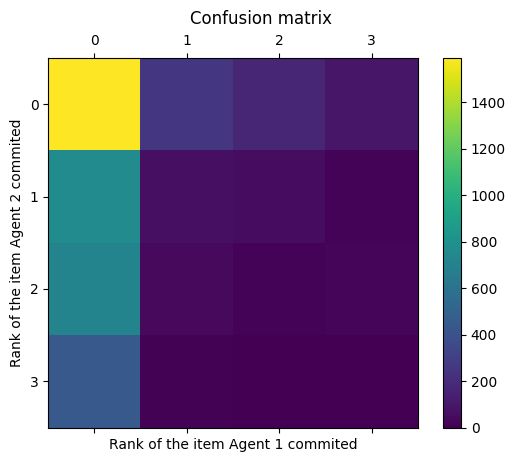

In [8]:
print(confusion_matrix)

fig, ax = plt.subplots()
mappable = ax.matshow(confusion_matrix)
ax.set_xlabel("Rank of the item Agent 1 commited")
ax.set_ylabel("Rank of the item Agent 2 commited")
fig.colorbar(mappable)
fig.suptitle("Confusion matrix")
plt.show()